<a href="https://colab.research.google.com/github/Nitishks2003/open-project/blob/main/Hotel_Booking_Demand.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Data Ingestion

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

# Data ingestion
data = pd.read_csv("/content/drive/MyDrive/Projects/Dataset/hotel_bookings.csv")
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [ ]:
data.shape

(119390, 32)

#Data Understanding

In [ ]:
#Column names
print("Column Names:")
print(data.columns)

Column Names:
Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')


**hotel** : There are only two hotel types: Resort Hotel or City Hotel

**is_canceled** : "Value indicating if the booking was canceled (1) or not (0)

**lead_time**: Number of days that elapsed between the entering date of the booking into the PMS and the arrival date

**stays_in_weekend_nights**: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel

**stays_in_week_nights**: Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel

**meal**: Type of meal booked. Categories are presented in standard hospitality meal packages:
Undefined/SC – no meal package
BB – Bed & Breakfast
HB – Half board (breakfast and one other meal – usually dinner)
FB – Full board (breakfast, lunch and dinner)

**country**: Country of origin. Categories are represented in the ISO 3155–3:2013 format

**market_segment**: Market segment designation.
“TA” means “Travel Agents”
“TO” means “Tour Operators”

**distribution_channel**: Booking distribution channel.
“TA” means “Travel Agents”
“TO” means “Tour Operators”

**is_repeated_guest**: Value indicating if the booking name was from a repeated guest (1) or not (0)

**previous_cancellations**: Number of previous bookings that were cancelled by the customer prior to the current booking

**previous_bookings_not_canceled**: Number of previous bookings not cancelled by the customer prior to the current booking

**reserved_room_type**: Code of room type reserved.

assigned_room_type: Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request.

**booking_changes**: Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation

**deposit_type**: Indication on if the customer made a deposit to guarantee the booking.

**This variable can assume three categories:**
No Deposit – no deposit was made
Non Refund – a deposit was made in the value of the total stay cost
Refundable – a deposit was made with a value under the total cost of stay

**agent**: ID of the travel agency that made the booking

**company**: ID of the company/entity that made the booking or responsible for paying the booking.

**days_in_waiting_list**: Number of days the booking was in the waiting list before it was confirmed to the customer

**customer_type**: Type of booking, assuming one of four categories:
Contract - when the booking has an allotment or other type of contract associated to it
Group – when the booking is associated to a group
Transient – when the booking is not part of a group or contract, and is not associated to other Transient parties
Transient Party - when the booking is transient, but is associated to at least other transient booking

**adr**: Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying nights

**required_car_parking_spaces**: Number of car parking spaces required by the customer

**total_of_special_requests**: Number of special requests made by the customer (e.g. twin bed or high floor)

**reservation_status**: Reservation last status, assuming one of three categories:
Canceled – booking was canceled by the customer
Check-Out – customer has checked in but already departed
No-Show – customer did not check-in and did inform the hotel of the reason why

**reservation_status_date**: Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel

In [ ]:
# Show the data type of each column
data.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

In [ ]:
# Give information about the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [ ]:
#Generate deecriptive statistic summary of all numerical variables
data.describe().T

,count,mean,std,min,25%,50%,75%,max
is_canceled,119390.0,0.370416,0.482918,0.00,0.00,0.000,1.0,1.0
lead_time,119390.0,104.011416,106.863097,0.00,18.00,69.000,160.0,737.0
arrival_date_year,119390.0,2016.156554,0.707476,2015.00,2016.00,2016.000,2017.0,2017.0
arrival_date_week_number,119390.0,27.165173,13.605138,1.00,16.00,28.000,38.0,53.0
arrival_date_day_of_month,119390.0,15.798241,8.780829,1.00,8.00,16.000,23.0,31.0
stays_in_weekend_nights,119390.0,0.927599,0.998613,0.00,0.00,1.000,2.0,19.0
stays_in_week_nights,119390.0,2.500302,1.908286,0.00,1.00,2.000,3.0,50.0
adults,119390.0,1.856403,0.579261,0.00,2.00,2.000,2.0,55.0
children,119386.0,0.103890,0.398561,0.00,0.00,0.000,0.0,10.0
babies,119390.0,0.007949,0.097436,0.00,0.00,0.000,0.0,10.0


In [ ]:
# Show the number of unique observations for each column
data.nunique()

hotel                                2
is_canceled                          2
lead_time                          479
arrival_date_year                    3
arrival_date_month                  12
arrival_date_week_number            53
arrival_date_day_of_month           31
stays_in_weekend_nights             17
stays_in_week_nights                35
adults                              14
children                             5
babies                               5
meal                                 5
country                            177
market_segment                       8
distribution_channel                 5
is_repeated_guest                    2
previous_cancellations              15
previous_bookings_not_canceled      73
reserved_room_type                  10
assigned_room_type                  12
booking_changes                     21
deposit_type                         3
agent                              333
company                            352
days_in_waiting_list     

In [ ]:
# Show all the unique hotel types in the ‘hotel’ column
data['hotel'].unique()

array(['Resort Hotel', 'City Hotel'], dtype=object)

In [ ]:
# Count the unique values in the hotel column
data['hotel'].value_counts()

hotel
City Hotel      79330
Resort Hotel    40060
Name: count, dtype: int64

In [ ]:
data['meal'].value_counts()

meal
BB           92310
HB           14463
SC           10650
Undefined     1169
FB             798
Name: count, dtype: int64

In [ ]:
data["babies"].value_counts()

babies
0     118473
1        900
2         15
10         1
9          1
Name: count, dtype: int64

In [ ]:
data['adults'].value_counts()

adults
2     89680
1     23027
3      6202
0       403
4        62
26        5
27        2
20        2
5         2
40        1
50        1
55        1
6         1
10        1
Name: count, dtype: int64

# Data Cleaning

In [ ]:
#Checking the missing values

data.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [ ]:
#missing values as a percentage
null_values_percentage = (data.isnull().sum()/len(data))*100
null_values_percentage

hotel                              0.000000
is_canceled                        0.000000
lead_time                          0.000000
arrival_date_year                  0.000000
arrival_date_month                 0.000000
arrival_date_week_number           0.000000
arrival_date_day_of_month          0.000000
stays_in_weekend_nights            0.000000
stays_in_week_nights               0.000000
adults                             0.000000
children                           0.003350
babies                             0.000000
meal                               0.000000
country                            0.408744
market_segment                     0.000000
distribution_channel               0.000000
is_repeated_guest                  0.000000
previous_cancellations             0.000000
previous_bookings_not_canceled     0.000000
reserved_room_type                 0.000000
assigned_room_type                 0.000000
booking_changes                    0.000000
deposit_type                    

In [ ]:
#lets drop the column company
data.drop(columns=['company'], inplace= True )

In [ ]:
# beacause the percentage of nan values is really low lets errase the nana instances of this 2 columns
data.dropna(subset=  ['children','country'], inplace = True)

In [ ]:
#since agent is a ID category we substitute the nan values with the mode
data.fillna(data['agent'].mode()[0], inplace = True)

In [ ]:
# lets see if the nan values where handeled
data.isnull().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces 

In [ ]:
#drop irrational data
data.drop([46619,78656], axis=0, inplace=True)

#Feature Engineering and Selection

In [ ]:
# Copy hotel dataframe into a new one that will be engineered
hotel_eng = pd.DataFrame()
hotel_eng = data.copy()

In [ ]:
# First lets start by transforming the months colum into a numerical one mapping the names of the months into the month number
month_to_number = {
    'January': 1,
    'February': 2,
    'March': 3,
    'April': 4,
    'May': 5,
    'June': 6,
    'July': 7,
    'August': 8,
    'September': 9,
    'October': 10,
    'November': 11,
    'December': 12
}

# Map month names to month numbers using the dictionary
hotel_eng['arrival_date_month'] = hotel_eng['arrival_date_month'].map(month_to_number)

# Lets combine the 3 arrival colums into a single one named arrival_date
hotel_eng['arrival_date'] = pd.to_datetime(hotel_eng['arrival_date_year'].astype(str) + '-' +
                                    hotel_eng['arrival_date_month'].astype(str) + '-' +
                                    hotel_eng['arrival_date_day_of_month'].astype(str))

In [ ]:
hotel_eng.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date
0,Resort Hotel,0,342,2015,7,27,1,0,0,2,...,No Deposit,9.0,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01
1,Resort Hotel,0,737,2015,7,27,1,0,0,2,...,No Deposit,9.0,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01
2,Resort Hotel,0,7,2015,7,27,1,0,1,1,...,No Deposit,9.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01
3,Resort Hotel,0,13,2015,7,27,1,0,1,1,...,No Deposit,304.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01
4,Resort Hotel,0,14,2015,7,27,1,0,2,2,...,No Deposit,240.0,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-07-01


In [ ]:
# we now have the arrive month as a number the column, redundant with arrival_date_week_number so drop (strong correlation, bad for ML models input)
hotel_eng.drop(columns=['arrival_date_week_number'], inplace= True )

In [ ]:
#show the categories in the reservation_status
hotel_eng['reservation_status'].unique()

array(['Check-Out', 'Canceled', 'No-Show'], dtype=object)

Dropping the columns "reservation_status" and "reservation_status_date" is important because they directly reveal whether a booking was canceled or not, which would unfairly influence our prediction model and cause data leakage.

In [ ]:
# droping the 2 columns mentioned above

hotel_eng.drop(columns=['reservation_status','reservation_status_date'], inplace= True )

#Exploratory Data Analysis

In [ ]:
hotel_eng.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'meal', 'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'arrival_date'],
      dtype='object')

In [ ]:
hotel_eng.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,arrival_date
0,Resort Hotel,0,342,2015,7,1,0,0,2,0.0,...,C,3,No Deposit,9.0,0,Transient,0.0,0,0,2015-07-01
1,Resort Hotel,0,737,2015,7,1,0,0,2,0.0,...,C,4,No Deposit,9.0,0,Transient,0.0,0,0,2015-07-01
2,Resort Hotel,0,7,2015,7,1,0,1,1,0.0,...,C,0,No Deposit,9.0,0,Transient,75.0,0,0,2015-07-01
3,Resort Hotel,0,13,2015,7,1,0,1,1,0.0,...,A,0,No Deposit,304.0,0,Transient,75.0,0,0,2015-07-01
4,Resort Hotel,0,14,2015,7,1,0,2,2,0.0,...,A,0,No Deposit,240.0,0,Transient,98.0,0,1,2015-07-01


#Bar plot for cancellation and non_ cacellation

<ipython-input-29-79794088a350>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=percentage.index, y=percentage, palette=['darkturquoise', 'royalblue'])


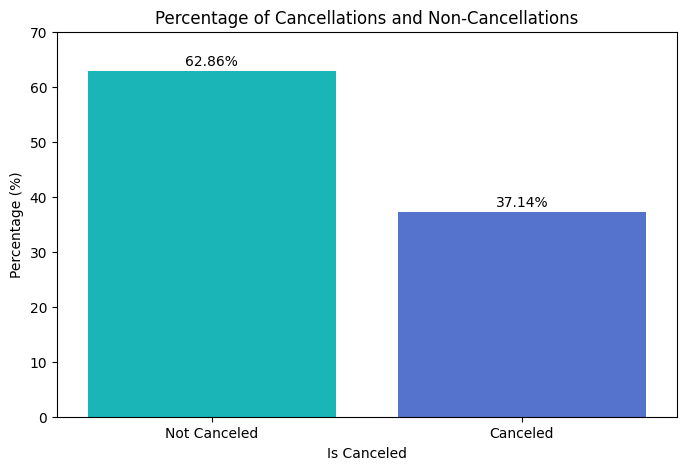

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
# Calculating the percentage of each class
percentage = hotel_eng['is_canceled'].value_counts(normalize=True) * 100

# Plotting the percentage of each class
plt.figure(figsize=(8, 5))
ax = sns.barplot(x=percentage.index, y=percentage, palette=['darkturquoise', 'royalblue'])
plt.title('Percentage of Cancellations and Non-Cancellations')
plt.xlabel('Is Canceled')
plt.ylabel('Percentage (%)')
plt.xticks(ticks=[0, 1], labels=['Not Canceled', 'Canceled'])
plt.yticks(ticks=range(0,80,10))

# Displaying the percentage on the bars
for i, p in enumerate(percentage):
    ax.text(i, p + 0.5, f'{p:.2f}%', ha='center', va='bottom')

plt.show()

#Box plot for hotel

In [ ]:
import plotly.express as px

# Assuming 'df' is your DataFrame and is already defined
data = hotel_eng[hotel_eng['is_canceled'] == 0]

fig = px.box(
    data_frame=data,
    x='reserved_room_type',
    y='adr',
    color='hotel',
    template='plotly_dark'
)

fig.show()


# Separating the numerical and categorical columns

In [ ]:
hotel_eng_ny=hotel_eng.drop(columns=['arrival_date','arrival_date_year'],axis=1)

In [ ]:
#lets select the categorical coluns to make some count plots
hotel_eng_ny_cat = hotel_eng_ny.select_dtypes(include=['object'])
hotel_eng_ny_cat

,hotel,meal,country,market_segment,distribution_channel,reserved_room_type,assigned_room_type,deposit_type,customer_type
0,Resort Hotel,BB,PRT,Direct,Direct,C,C,No Deposit,Transient
1,Resort Hotel,BB,PRT,Direct,Direct,C,C,No Deposit,Transient
2,Resort Hotel,BB,GBR,Direct,Direct,A,C,No Deposit,Transient
3,Resort Hotel,BB,GBR,Corporate,Corporate,A,A,No Deposit,Transient
4,Resort Hotel,BB,GBR,Online TA,TA/TO,A,A,No Deposit,Transient
...,...,...,...,...,...,...,...,...,...
119385,City Hotel,BB,BEL,Offline TA/TO,TA/TO,A,A,No Deposit,Transient
119386,City Hotel,BB,FRA,Online TA,TA/TO,E,E,No Deposit,Transient
119387,City Hotel,BB,DEU,Online TA,TA/TO,D,D,No Deposit,Transient
119388,City Hotel,BB,GBR,Online TA,TA/TO,A,A,No Deposit,Transient


In [ ]:
# Drop non-numerical variables
hotel_eng_ny_num=hotel_eng_ny.drop(columns=hotel_eng_ny_cat.columns )
hotel_eng_ny_num

,is_canceled,lead_time,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,0,342,7,1,0,0,2,0.0,0,0,0,0,3,9.0,0,0.00,0,0
1,0,737,7,1,0,0,2,0.0,0,0,0,0,4,9.0,0,0.00,0,0
2,0,7,7,1,0,1,1,0.0,0,0,0,0,0,9.0,0,75.00,0,0
3,0,13,7,1,0,1,1,0.0,0,0,0,0,0,304.0,0,75.00,0,0
4,0,14,7,1,0,2,2,0.0,0,0,0,0,0,240.0,0,98.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,0,23,8,30,2,5,2,0.0,0,0,0,0,0,394.0,0,96.14,0,0
119386,0,102,8,31,2,5,3,0.0,0,0,0,0,0,9.0,0,225.43,0,2
119387,0,34,8,31,2,5,2,0.0,0,0,0,0,0,9.0,0,157.71,0,4
119388,0,109,8,31,2,5,2,0.0,0,0,0,0,0,89.0,0,104.40,0,0


#Plotting for categorical columns

In [ ]:
import plotly.express as px

# List of columns to plot
plots = ["hotel", "meal", "market_segment", "reserved_room_type", "deposit_type", "customer_type"]

# Iterate over each column in the DataFrame
for column in plots:
    # Create the countplot for the current column
    fig = px.histogram(
        hotel_eng_ny_cat,
        x=column,
        color=column,
        barmode='group',
        title=f"Countplot of {column}",
        labels={column: column, 'count': 'Count'},
        template='plotly_dark'
    )

    # Show the plot
    fig.show()


#Plotting for Numerical columns

In [ ]:
import plotly.express as px

# Assuming 'hotel_eng_ny_num' is your DataFrame with numerical columns
numerical_columns = hotel_eng_ny_num.columns

# Iterate over each numerical column and create a histogram
for column in numerical_columns:
    fig = px.histogram(
        hotel_eng_ny_num,
        x=column,
        nbins=50,
        title=f"Histogram of {column}",
        labels={column: column, 'count': 'Count'},
        template='plotly_dark'
    )

    # Adjusting the size of the figure
    fig.update_layout(
        width=800,
        height=600
    )

    # Show the plot
    fig.show()

# Correlation Matrix Heatmap

In [ ]:
import plotly.graph_objects as go

# Assuming 'hotel_eng_ny_num' is your DataFrame with numerical columns
cormat = hotel_eng_ny_num.corr()

# Create the heatmap using Plotly
fig = go.Figure(data=go.Heatmap(
    z=cormat.values,
    x=cormat.columns,
    y=cormat.index,
    colorscale='RdBu',  # Choose a suitable colorscale
    zmin=-1, zmax=1,  # Set the color scale range (-1 to 1 for correlation)
    colorbar=dict(title='Correlation'),  # Add color bar with title
))

# Customize layout
fig.update_layout(
    title='Correlation Matrix Heatmap',
    xaxis=dict(title='Features'),
    yaxis=dict(title='Features'),
    width=1000,
    height=800,
    template='plotly_dark'
)

# Show plot
fig.show()

#Data Preparation

 Encoding of categorical columns

In [ ]:
#descriptive stats from the cat variables
hotel_eng_ny_cat.describe().T

,count,unique,top,freq
hotel,118896,2,City Hotel,79300
meal,118896,5,BB,91861
country,118896,177,PRT,48585
market_segment,118896,7,Online TA,56401
distribution_channel,118896,5,TA/TO,97729
reserved_room_type,118896,10,A,85600
assigned_room_type,118896,12,A,73863
deposit_type,118896,3,No Deposit,104161
customer_type,118896,4,Transient,89173


country has 177 unique values, with the vast majority PRT,its irrelevant
so the column has been dropped.

In [ ]:
# drop country as encoding it does not introduce information for the models
hotel_eng_ny_cat.drop(columns=['country'],inplace=True)

In [ ]:
hotel_eng_ny_cat

,hotel,meal,market_segment,distribution_channel,reserved_room_type,assigned_room_type,deposit_type,customer_type
0,Resort Hotel,BB,Direct,Direct,C,C,No Deposit,Transient
1,Resort Hotel,BB,Direct,Direct,C,C,No Deposit,Transient
2,Resort Hotel,BB,Direct,Direct,A,C,No Deposit,Transient
3,Resort Hotel,BB,Corporate,Corporate,A,A,No Deposit,Transient
4,Resort Hotel,BB,Online TA,TA/TO,A,A,No Deposit,Transient
...,...,...,...,...,...,...,...,...
119385,City Hotel,BB,Offline TA/TO,TA/TO,A,A,No Deposit,Transient
119386,City Hotel,BB,Online TA,TA/TO,E,E,No Deposit,Transient
119387,City Hotel,BB,Online TA,TA/TO,D,D,No Deposit,Transient
119388,City Hotel,BB,Online TA,TA/TO,A,A,No Deposit,Transient


In [ ]:
#encode the dummies
X_encoded=pd.get_dummies(hotel_eng_ny_cat)

#replace space with '-'
X_encoded.columns = X_encoded.columns.str.replace(' ', '-')

In [ ]:
X_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 118896 entries, 0 to 119389
Data columns (total 48 columns):
 #   Column                          Non-Null Count   Dtype
---  ------                          --------------   -----
 0   hotel_City-Hotel                118896 non-null  bool 
 1   hotel_Resort-Hotel              118896 non-null  bool 
 2   meal_BB                         118896 non-null  bool 
 3   meal_FB                         118896 non-null  bool 
 4   meal_HB                         118896 non-null  bool 
 5   meal_SC                         118896 non-null  bool 
 6   meal_Undefined                  118896 non-null  bool 
 7   market_segment_Aviation         118896 non-null  bool 
 8   market_segment_Complementary    118896 non-null  bool 
 9   market_segment_Corporate        118896 non-null  bool 
 10  market_segment_Direct           118896 non-null  bool 
 11  market_segment_Groups           118896 non-null  bool 
 12  market_segment_Offline-TA/TO    118896 non-null  

#Combine the numerical and encoded categorical dataframes

In [ ]:
# combining the numerical colums with the encoded variables

data = hotel_eng_ny_num.join(X_encoded, lsuffix='_left', rsuffix='_right')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 118896 entries, 0 to 119389
Data columns (total 66 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   is_canceled                     118896 non-null  int64  
 1   lead_time                       118896 non-null  int64  
 2   arrival_date_month              118896 non-null  int64  
 3   arrival_date_day_of_month       118896 non-null  int64  
 4   stays_in_weekend_nights         118896 non-null  int64  
 5   stays_in_week_nights            118896 non-null  int64  
 6   adults                          118896 non-null  int64  
 7   children                        118896 non-null  float64
 8   babies                          118896 non-null  int64  
 9   is_repeated_guest               118896 non-null  int64  
 10  previous_cancellations          118896 non-null  int64  
 11  previous_bookings_not_canceled  118896 non-null  int64  
 12  booking_changes      

In [ ]:
data.head()

,is_canceled,lead_time,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,...,assigned_room_type_K,assigned_room_type_L,assigned_room_type_P,deposit_type_No-Deposit,deposit_type_Non-Refund,deposit_type_Refundable,customer_type_Contract,customer_type_Group,customer_type_Transient,customer_type_Transient-Party
0,0,342,7,1,0,0,2,0.0,0,0,...,False,False,False,True,False,False,False,False,True,False
1,0,737,7,1,0,0,2,0.0,0,0,...,False,False,False,True,False,False,False,False,True,False
2,0,7,7,1,0,1,1,0.0,0,0,...,False,False,False,True,False,False,False,False,True,False
3,0,13,7,1,0,1,1,0.0,0,0,...,False,False,False,True,False,False,False,False,True,False
4,0,14,7,1,0,2,2,0.0,0,0,...,False,False,False,True,False,False,False,False,True,False


#Splitting independent and target variable

In [ ]:
# y is target variable
y = data['is_canceled']
y

0         0
1         0
2         0
3         0
4         0
         ..
119385    0
119386    0
119387    0
119388    0
119389    0
Name: is_canceled, Length: 118896, dtype: int64

In [ ]:
# x is i independent variable
X = data.drop(['is_canceled'], axis=1)

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 118896 entries, 0 to 119389
Data columns (total 65 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   lead_time                       118896 non-null  int64  
 1   arrival_date_month              118896 non-null  int64  
 2   arrival_date_day_of_month       118896 non-null  int64  
 3   stays_in_weekend_nights         118896 non-null  int64  
 4   stays_in_week_nights            118896 non-null  int64  
 5   adults                          118896 non-null  int64  
 6   children                        118896 non-null  float64
 7   babies                          118896 non-null  int64  
 8   is_repeated_guest               118896 non-null  int64  
 9   previous_cancellations          118896 non-null  int64  
 10  previous_bookings_not_canceled  118896 non-null  int64  
 11  booking_changes                 118896 non-null  int64  
 12  agent                

In [ ]:
X.head()

,lead_time,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,...,assigned_room_type_K,assigned_room_type_L,assigned_room_type_P,deposit_type_No-Deposit,deposit_type_Non-Refund,deposit_type_Refundable,customer_type_Contract,customer_type_Group,customer_type_Transient,customer_type_Transient-Party
0,342,7,1,0,0,2,0.0,0,0,0,...,False,False,False,True,False,False,False,False,True,False
1,737,7,1,0,0,2,0.0,0,0,0,...,False,False,False,True,False,False,False,False,True,False
2,7,7,1,0,1,1,0.0,0,0,0,...,False,False,False,True,False,False,False,False,True,False
3,13,7,1,0,1,1,0.0,0,0,0,...,False,False,False,True,False,False,False,False,True,False
4,14,7,1,0,2,2,0.0,0,0,0,...,False,False,False,True,False,False,False,False,True,False


In [ ]:
# Split the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Model Training and Evaluation

Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Initialize and train the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
rf_train_predictions = rf_model.predict(X_train)
rf_test_predictions = rf_model.predict(X_test)

# Classification Reports
print("Random Forest - Training Set")
print(classification_report(y_train, rf_train_predictions))
print("Random Forest - Testing Set")
print(classification_report(y_test, rf_test_predictions))

Random Forest - Training Set
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     59884
           1       0.99      0.99      0.99     35232

    accuracy                           0.99     95116
   macro avg       0.99      0.99      0.99     95116
weighted avg       0.99      0.99      0.99     95116

Random Forest - Testing Set
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     14859
           1       0.87      0.77      0.81      8921

    accuracy                           0.87     23780
   macro avg       0.87      0.85      0.86     23780
weighted avg       0.87      0.87      0.87     23780



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for Random Forest
rf_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the GridSearchCV object
rf_grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42),
                              param_grid=rf_param_grid,
                              cv=3,
                              n_jobs=-1,
                              verbose=2,
                              scoring='accuracy')

# Fit the GridSearchCV object
rf_grid_search.fit(X_train, y_train)

# Best parameters and best score
print("Best parameters for Random Forest:", rf_grid_search.best_params_)
print("Best cross-validation score for Random Forest:", rf_grid_search.best_score_)

# Evaluate on the test set
rf_best_model = rf_grid_search.best_estimator_
rf_test_predictions = rf_best_model.predict(X_test)
print("Random Forest - Test Set")
print(classification_report(y_test, rf_test_predictions))

Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best cross-validation score for Random Forest: 0.8657639026701647
Random Forest - Test Set
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     14859
           1       0.87      0.77      0.81      8921

    accuracy                           0.87     23780
   macro avg       0.87      0.85      0.86     23780
weighted avg       0.87      0.87      0.87     23780



XGBoost Classifier

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report

# Initialize and train the XGBoost model
xgb_model = XGBClassifier(random_state=42)
xgb_model.fit(X_train, y_train)

# Predictions
xgb_train_predictions = xgb_model.predict(X_train)
xgb_test_predictions = xgb_model.predict(X_test)

# Classification Reports
print("XGBoost - Training Set")
print(classification_report(y_train, xgb_train_predictions))
print("XGBoost - Testing Set")
print(classification_report(y_test, xgb_test_predictions))

XGBoost - Training Set
              precision    recall  f1-score   support

           0       0.86      0.94      0.90     59884
           1       0.87      0.74      0.80     35232

    accuracy                           0.86     95116
   macro avg       0.87      0.84      0.85     95116
weighted avg       0.86      0.86      0.86     95116

XGBoost - Testing Set
              precision    recall  f1-score   support

           0       0.84      0.93      0.89     14859
           1       0.86      0.71      0.78      8921

    accuracy                           0.85     23780
   macro avg       0.85      0.82      0.83     23780
weighted avg       0.85      0.85      0.85     23780



Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Initialize and train the Logistic Regression model
logreg_model = LogisticRegression(random_state=42, max_iter=1000)
logreg_model.fit(X_train, y_train)

# Predictions
logreg_train_predictions = logreg_model.predict(X_train)
logreg_test_predictions = logreg_model.predict(X_test)

# Classification Reports
print("Logistic Regression - Training Set")
print(classification_report(y_train, logreg_train_predictions))
print("Logistic Regression - Testing Set")
print(classification_report(y_test, logreg_test_predictions))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Logistic Regression - Training Set
              precision    recall  f1-score   support

           0       0.80      0.93      0.86     59884
           1       0.83      0.62      0.71     35232

    accuracy                           0.81     95116
   macro avg       0.82      0.77      0.79     95116
weighted avg       0.82      0.81      0.81     95116

Logistic Regression - Testing Set
              precision    recall  f1-score   support

           0       0.80      0.93      0.86     14859
           1       0.83      0.60      0.70      8921

    accuracy                           0.81     23780
   macro avg       0.82      0.77      0.78     23780
weighted avg       0.81      0.81      0.80     23780



#Hyperparameter Tuning

Random Forest Hyperparameter Tuning with Random Search

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

# Define the parameter distributions for Random Forest
rf_param_dist = {
    'n_estimators': randint(50, 200),
    'max_depth': [None] + list(randint(3, 30).rvs(10)),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10)
}

# Initialize the RandomizedSearchCV object
rf_random_search = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42),
                                      param_distributions=rf_param_dist,
                                      n_iter=100,
                                      cv=3,
                                      n_jobs=-1,
                                      verbose=2,
                                      random_state=42,
                                      scoring='accuracy')

# Fit the RandomizedSearchCV object
rf_random_search.fit(X_train, y_train)

# Best parameters and best score
print("Best parameters for Random Forest:", rf_random_search.best_params_)
print("Best cross-validation score for Random Forest:", rf_random_search.best_score_)

# Evaluate on the test set
rf_best_model = rf_random_search.best_estimator_
rf_test_predictions = rf_best_model.predict(X_test)
print("Random Forest - Test Set")
print(classification_report(y_test, rf_test_predictions))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
